# Model Building

Wir trainieren unser model auf alle 20 rmps und geben 20 rmps (als matrix) zurück. Das trainierte modell testen wir mit einem reversed-Dataframe (Code oben erneut ausführen und das fitting auslassen)

## Imports

In [1]:
# Imports
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt 
from sklearn.impute import SimpleImputer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import *
from tensorflow.keras.metrics import MeanSquaredError
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import tensorflow.keras as K

from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

Set Graphic Resulution

In [2]:
#plt.rcParams['figure.dpi'] = 300
#plt.rcParams['savefig.dpi'] = 300

Read In the different Datasets

In [3]:
df = pd.read_excel('DiscreteMotion_Data_Horizontalsetup.xlsx')

In [21]:
#reverse table // erst nach dem training ausführen um gegenzuchecken

df = df.iloc[:, ::-1]

In [25]:
df

,Pow_2000,Pow_1900,Pow_1800,Pow_1700,Pow_1600,Pow_1500,Pow_1400,Pow_1300,Pow_1200,Pow_1100,Pow_1000,Pow_900,Pow_800,Pow_700,Pow_600,Pow_500,Pow_400,Pow_300,Pow_200,Pow_100
time_index,,,,,,,,,,,,,,,,,,,,
1970-01-01 00:00:00.000,0.202,13.938000,19.096001,9.555000,9.990001,12.599000,7.950,12.059999,6.578000,10.981999,9.974999,9.240,7.860,5.616,0.516,4.009,0.255,0.014,0.044,0.846
1970-01-01 00:00:00.001,0.202,13.938000,19.096001,9.555000,9.990001,12.599000,7.950,12.059999,6.578000,10.981999,9.974999,9.240,7.860,5.616,0.516,4.009,0.255,0.167,0.044,0.846
1970-01-01 00:00:00.002,0.564,11.039999,13.454000,10.465000,9.990001,12.599000,7.830,11.834999,6.578000,9.728000,9.974999,9.240,6.930,5.400,5.676,4.009,0.255,0.167,0.044,0.846
1970-01-01 00:00:00.003,0.564,11.039999,13.454000,10.465000,9.287000,7.267000,7.830,11.834999,6.578000,9.728000,8.014999,7.854,6.930,5.400,5.676,4.199,4.080,0.167,0.147,0.774
1970-01-01 00:00:00.004,10.434,11.280000,13.454000,15.548001,9.287000,7.267000,12.267,11.834999,10.372999,9.472000,8.014999,7.854,6.468,5.400,5.676,4.199,4.080,2.171,0.147,0.774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1970-01-01 00:00:44.995,0.867,0.945000,8.487000,0.315000,11.440000,15.452999,15.216,10.780001,4.680000,0.828000,0.345000,0.315,0.000,0.128,5.566,3.287,0.255,2.160,1.476,1.190
1970-01-01 00:00:44.996,0.867,0.945000,8.487000,0.315000,11.440000,15.452999,15.216,8.330000,4.680000,0.828000,0.345000,0.315,0.000,0.128,5.566,3.287,0.255,2.160,1.476,1.190
1970-01-01 00:00:44.997,9.248,0.945000,8.487000,0.315000,11.440000,15.452999,15.216,8.330000,2.106000,10.764000,0.345000,0.315,0.000,0.128,5.566,3.287,0.255,2.160,1.476,1.190


Set the dataframes' time index to a 45000 entity long datetime64 range separated by 10 ms

In [23]:
time_index = np.arange('1970-01-01T00:00:00.000', '1970-01-01T00:07:30.000',dtype='datetime64[10ms]')
df['time_index'] = time_index
df.set_index('time_index', inplace=True)

<ipython-input-23-5953195616c8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time_index'] = time_index


In [24]:
df.describe()

,Pow_2000,Pow_1900,Pow_1800,Pow_1700,Pow_1600,Pow_1500,Pow_1400,Pow_1300,Pow_1200,Pow_1100,Pow_1000,Pow_900,Pow_800,Pow_700,Pow_600,Pow_500,Pow_400,Pow_300,Pow_200,Pow_100
count,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000
mean,4.217175,4.218840,4.182729,4.156900,4.052579,3.908951,3.902852,3.732571,3.577217,3.453644,3.295054,3.118614,2.848026,2.730921,2.493221,2.206332,1.951205,1.604354,1.249023,0.843142
std,6.150047,6.142617,5.949107,5.836061,5.600147,5.244952,5.014324,4.628946,4.300227,3.955490,3.574365,3.201309,2.785256,2.446147,2.058099,1.663406,1.298846,0.920542,0.579047,0.253721
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.270000,0.255000,0.256000,0.273000,0.255000,0.243000,0.256000,0.234000,0.238000,0.264000,0.264000,0.258000,0.244000,0.264000,0.265500,0.264000,0.294000,0.531000,1.332000,0.834000
50%,0.447000,0.417000,0.405000,0.426000,0.434500,0.486000,0.417000,0.458000,0.516000,0.606000,0.735000,0.828000,1.220000,2.873000,3.738000,3.204000,2.625000,2.040000,1.458000,0.900000
75%,7.175000,7.232000,7.560000,7.524000,7.525000,7.670001,8.613000,8.649000,8.639999,8.103001,7.310000,6.498750,5.655000,4.950000,4.242000,3.553000,2.896000,2.210000,1.575000,0.960000
max,23.487999,23.808001,22.019999,20.235001,19.139999,17.237999,16.224001,14.899000,13.631000,12.558001,11.375999,10.642000,9.641000,9.099999,7.608000,6.380000,5.100000,3.528000,2.360000,1.316000


## Defining Functions

Split the data accoring into Train Data (80%) , Validation Data (10%) and Test Data (10%) 

In [26]:
def split_data(df):
    train = df[:36000]
    val = df[36000:40500]
    test = df[40500:]
    return train, val, test

Normalize the Data in a range between 0 and 1

In [27]:
def scale_data(train, val, test):
    scaler = MinMaxScaler(feature_range=(0,1))
    train_scaled = scaler.fit_transform(train)
    val_scaled = scaler.transform(val)
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, val_scaled, test_scaled

function to create 3D arrays with certain window sizes for X_input and Y_output **(Window-Size Approach)**




In [28]:
def to_supervised(sequence, window_size, forecast_horizon):
    X, y = [], []
    for i in range(len(sequence) - window_size - forecast_horizon + 1):
        X.append(sequence[i:i+window_size])
        y.append(sequence[i+window_size:i+window_size+forecast_horizon])
    return np.array(X), np.array(y)

## Data Preparation

Split the dataframe into Train-, Val- and Test Data

In [29]:
train, val, test = split_data(df)

Scale the Data betweet 0 and 1 using the MinMaxScaler

In [30]:
scaler, train, val, test = scale_data(train, val, test)

Prepare the input for supervised learning (using a **window-size of 40** and a **forecast-horizon of 20**)

In [31]:
X_train, y_train = to_supervised(train, window_size=40, forecast_horizon=20)
X_val, y_val = to_supervised(val, window_size=40, forecast_horizon=20)
X_test, y_test = to_supervised(test, window_size=40, forecast_horizon=20)

Check the shape of the Training Data

In [32]:
X_train.shape

(35941, 40, 20)

## Build LSTM Model

### Model Summary

In [14]:
model = Sequential()
model.add(LSTM(128, input_shape=(40, 20), activation='relu'))
model.add(RepeatVector(20))
model.add(LSTM(64, return_sequences=True))
model.add(TimeDistributed(Dense(32)))
model.add(Dense(20))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               76288     
                                                                 
 repeat_vector (RepeatVector  (None, 20, 128)          0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 20, 64)            49408     
                                                                 
 time_distributed (TimeDistr  (None, 20, 32)           2080      
 ibuted)                                                         
                                                                 
 dense_1 (Dense)             (None, 20, 20)            660       
                                                                 
Total params: 128,436
Trainable params: 128,436
Non-trai

### Compile the LSTM Model

In [16]:
model.compile(loss='mae', optimizer=Adam(learning_rate=0.001), metrics=['mse'])

Create Callback and Fit the Training Dataset

In [17]:
stop_early_lstm = K.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[stop_early_lstm])

Epoch 1/10
1124/1124 [==============================] - 96s 82ms/step - loss: 0.1732 - mse: 0.0652 - val_loss: 0.1407 - val_mse: 0.0419
Epoch 2/10
1124/1124 [==============================] - 89s 79ms/step - loss: 0.1280 - mse: 0.0369 - val_loss: 0.1185 - val_mse: 0.0320
Epoch 3/10
1124/1124 [==============================] - 88s 79ms/step - loss: 0.1129 - mse: 0.0305 - val_loss: 0.1086 - val_mse: 0.0284
Epoch 4/10
1124/1124 [==============================] - 86s 76ms/step - loss: 0.1048 - mse: 0.0282 - val_loss: 0.1008 - val_mse: 0.0265
Epoch 5/10
1124/1124 [==============================] - 84s 75ms/step - loss: 0.0991 - mse: 0.0267 - val_loss: 0.0981 - val_mse: 0.0259
Epoch 6/10
1124/1124 [==============================] - 86s 76ms/step - loss: 0.0944 - mse: 0.0253 - val_loss: 0.0938 - val_mse: 0.0245
Epoch 7/10
1124/1124 [==============================] - 86s 77ms/step - loss: 0.0909 - mse: 0.0242 - val_loss: 0.0917 - val_mse: 0.0236
Epoch 8/10
1124/1124 [==========================

### Model History

Summarize and plot the history of the loss and val_loss

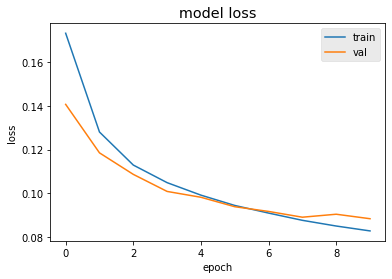

In [18]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.style.use("ggplot")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

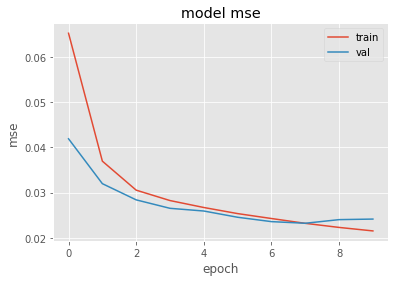

In [19]:
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.style.use("ggplot")
plt.title('model mse')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

Evaluate Model // Show the MAE and MSE metrics

In [33]:
model.evaluate(X_test, y_test)

139/139 [==============================] - 4s 27ms/step - loss: 0.2453 - mse: 0.1140


[0.24533499777317047, 0.11395423114299774]

### Predicting LSTM

Predict LSTM Model

In [34]:
yhat = model.predict(X_test)

139/139 [==============================] - 4s 26ms/step


In [35]:
test_shape = y_test.shape

Saving the shape of y_test

In [36]:
yhat.shape

(4441, 20, 20)

In [37]:
yhat

array([[[ 9.25770104e-02,  8.15684646e-02, -7.09334239e-02, ...,
          2.96133637e-01,  2.37641364e-01,  1.97188944e-01],
        [ 1.22596294e-01,  5.30187376e-02, -6.02998510e-02, ...,
          1.91694841e-01,  1.81933194e-01,  1.00240760e-01],
        [ 1.39132187e-01,  6.47626966e-02, -2.92064026e-02, ...,
          1.35926500e-01,  1.41963825e-01,  5.05424067e-02],
        ...,
        [ 4.02007371e-01,  2.50701070e-01,  1.46318883e-01, ...,
          2.04528458e-02, -8.56795441e-03,  6.10576198e-02],
        [ 4.09445614e-01,  3.12168270e-01,  1.91510051e-01, ...,
          1.88864954e-02, -1.06115593e-02,  6.49798512e-02],
        [ 4.18272763e-01,  3.78955305e-01,  2.73545116e-01, ...,
          1.78218968e-02, -1.36952354e-02,  7.11378753e-02]],

       [[ 9.86900479e-02,  7.77707100e-02, -6.72082528e-02, ...,
          3.03101033e-01,  2.48705998e-01,  2.00208336e-01],
        [ 1.32326603e-01,  4.54943925e-02, -5.52686527e-02, ...,
          1.86884716e-01,  1.89627394e

Backing up the data

In [38]:
yhat2 = yhat
y_test2 = y_test

New Unseen Predictions

Function for rescaling the Data fo fit into the DL-Models

In [39]:
def inverse_scale_data(yhat, y_test):
    yhat_reshaped = yhat.reshape(-1,yhat.shape[-1])
    y_test_reshaped = y_test.reshape(-1,y_test.shape[-1])

    yhat_inverse = scaler.inverse_transform(yhat_reshaped)
    y_test_inverse = scaler.inverse_transform(y_test_reshaped)
    return yhat_inverse, y_test_inverse

Rescale

In [40]:
def inverse_scale_data_alt(yhat, y_test):
    yhat_reshaped = yhat.reshape(-1,yhat.shape[-1])
    y_test_reshaped = y_test.reshape(-1,y_test.shape[-1])
    
    yhat_inverse = scaler.inverse_transform(yhat_reshaped)
    y_test_inverse = scaler.inverse_transform(y_test_reshaped)

    return yhat_inverse, y_test_inverse

In [41]:
re_yhat, re_y_test = inverse_scale_data_alt(yhat2, y_test2)

### Calculating the additional Predictions of 600ms (AddOn – Recursive Method)

In [42]:
y_test_3 = y_test
y_test_4 = y_test
y_test_5 = y_test

In [43]:
# reshape from 2D back to 3D (2D was necessary for the inverse scaling)
re_yhat2 = re_yhat.reshape(test_shape)
re_y_test2 = re_y_test.reshape(test_shape)

# Model Evaluation

## Defining Functions

In [44]:
from math import sqrt
# evaluate forecasts against expected values
def evaluate_forecasts(actual, predicted):
    scores_pow = results = np.zeros((20, 20))
    scores = []
 # calculate an RMSE score for each prediction period
    for i in range(actual.shape[1]):
      for t in range(actual.shape[2]):
       # calculate mse
       scores_pow[i, t] = sqrt(mean_squared_error(actual[:, t, i], predicted[:, t, i]))
 # calculate overall RMSE
    s = 0
    for row in range(actual.shape[0]):
        for col in range(actual.shape[1]):
            s += (actual[row, col, 1] - predicted[row, col, 1])**2
            score = sqrt(s / (actual.shape[0] * actual.shape[1]))
    return np.array(score), np.array(scores_pow)

In [45]:
def summarize_scores(name, score, scores):
    s_scores = ', '.join(['%.3f'% s for s in scores])
    print('%s: [%.3f] %s' % (name, score, s_scores))

## Evaluate Model

In [46]:
overall_RMSE, all_RMSEs = evaluate_forecasts(re_y_test2, re_yhat2)

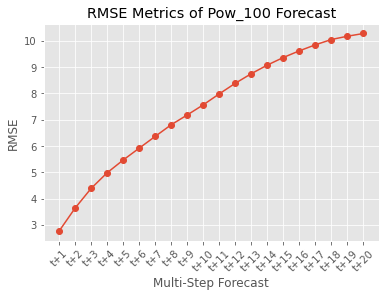

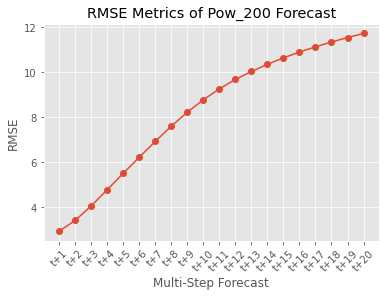

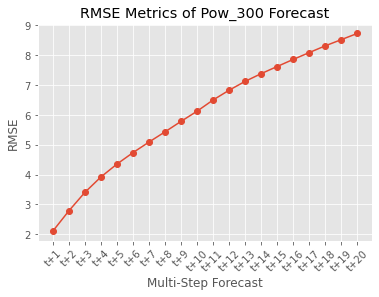

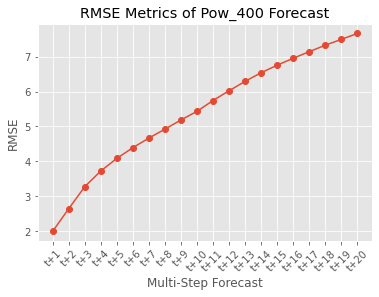

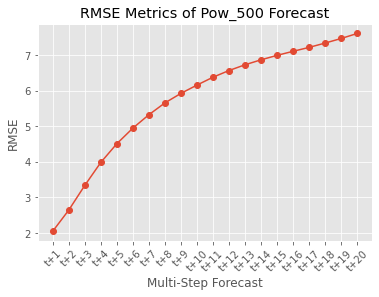

...

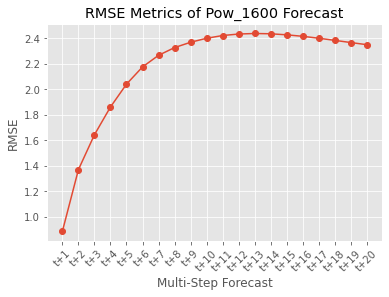

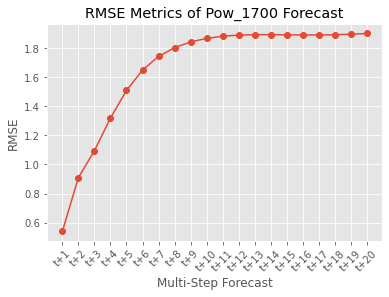

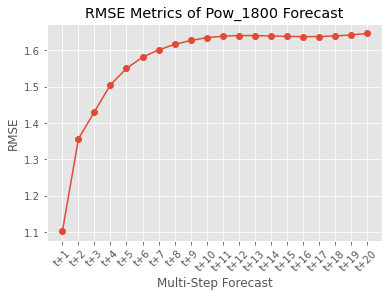

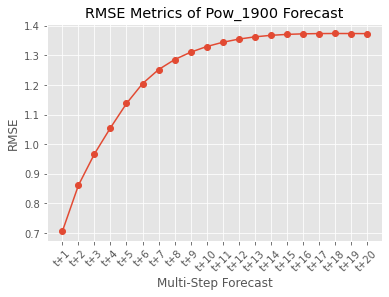

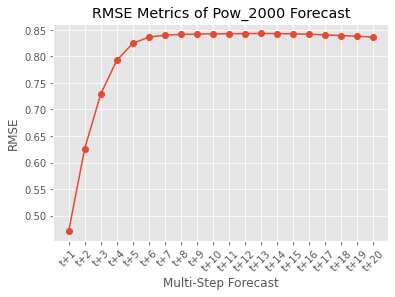

In [47]:
forecast = []
for i in range(1,21):
    title = f't+{i}'
    forecast.append(title)
for i in range(20):
  plt.style.use("ggplot")
  plt.plot(forecast, all_RMSEs[i], marker='o', label='lstm')
  plt.xticks(rotation=45)
  plt.title('RMSE Metrics of Pow_' +str(100*(i+1))+ ' Forecast')
  plt.xlabel('Multi-Step Forecast')
  plt.ylabel('RMSE')
  plt.show()

Build the dataframe for the additional 600ms predictions (Recursive Method)

**Function for printing out the 20 RMP`s Predictions vs. its Acutals**

In [48]:
from sklearn.metrics import r2_score
def print_act_and_pred_tables(yhat,ytest,forecast_horizon, start_graph,end_graph):
  pow_preds = []
  pow_actuals = []
  for i in range(20):
    pow_preds.append(yhat[:, forecast_horizon-1, i]) # 1 refers to the forecast horizon --> t+1; shape of yhat: [(length), (n_outputs), (n_features)]
    pow_actuals.append(ytest[:, 0, i])

  data = {}
  for i in range(20):
    pow_pred_label = f"Pow{100*(i+1)} Predictions"
    pow_act_label = f"Pow{100*(i+1)} Actuals"
    data[pow_pred_label] = pow_preds[i]
    data[pow_act_label] = pow_actuals[i]
  df_new = pd.DataFrame(data=data)
  #Plot
  for i in range(20):
    fig = plt.figure(figsize=(15, 7))
    plt.style.use("ggplot")
    # Select the actuals and predictions columns
    actuals = df_new[f"Pow{100*(i+1)} Actuals"][start_graph:end_graph]
    predictions = df_new[f"Pow{100*(i+1)} Predictions"][start_graph:end_graph]
    # shift the t+20 prediction 20 (relating to the wished forecast horizon) to the right
    p_temp = predictions.to_frame()
    p_temp['time_index_shift'] = predictions.index+forecast_horizon-1
    p_temp.set_index('time_index_shift', inplace=True)
    # Plot the data
    plt.plot(p_temp, alpha=0.6)
    plt.plot(actuals, alpha=0.7)
    # Set the plot title and axis labels
    plt.title(f'Pow{100*(i+1)} Predictions and Actuals (Discrete Motion)')
    plt.xlabel('Time in ms')
    plt.ylabel('Power Consumption in Watts')
    # Draw horizontal Lines for better comparison
    plt.axvline(x=4439, linestyle=":", color="grey")
    plt.axvline(x=4477, linestyle="-", linewidth = 75, color="red", alpha=0.05)
    # Set the legend
    plt.legend(['Predictions', 'Actuals'])
    # Show the plot
    plt.show()

## Print Actuals and Predictions

NEW inversed(Columns verschoben / inversed)

In [49]:
plt.rcParams['figure.dpi'] = 300

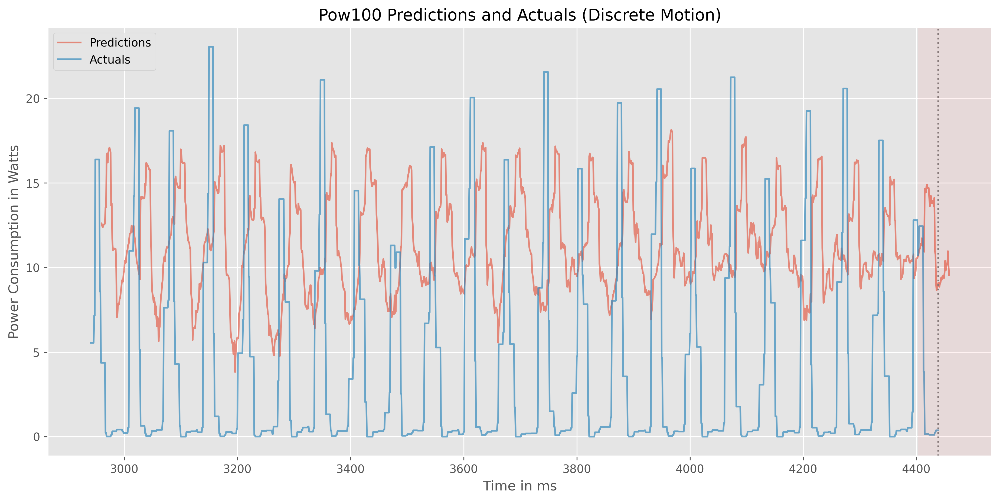

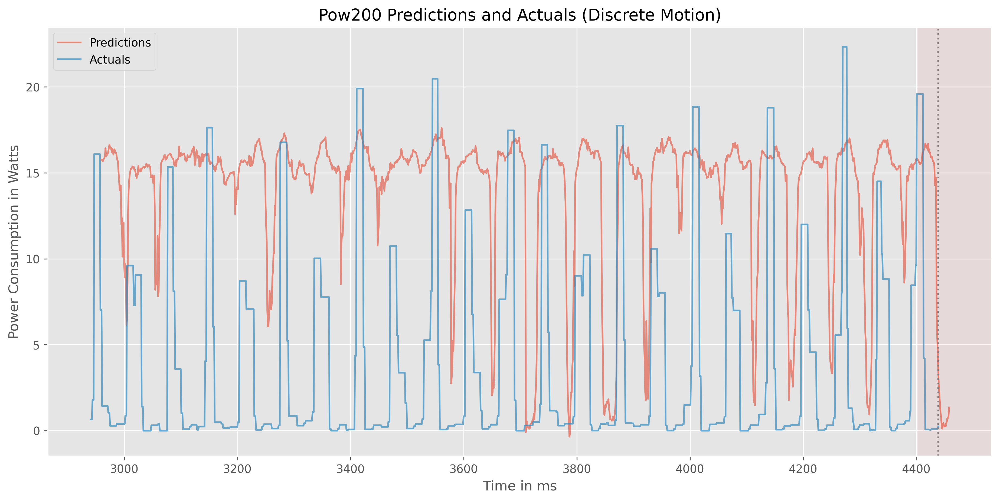

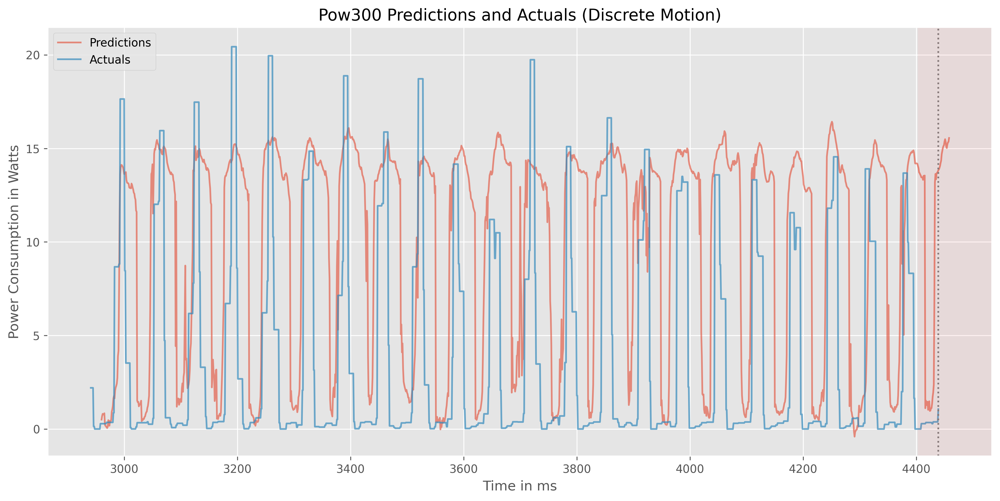

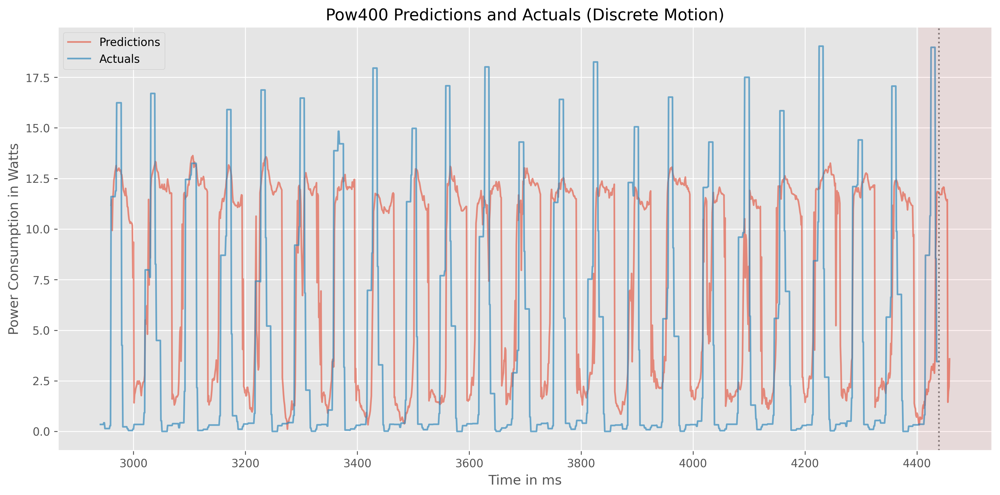

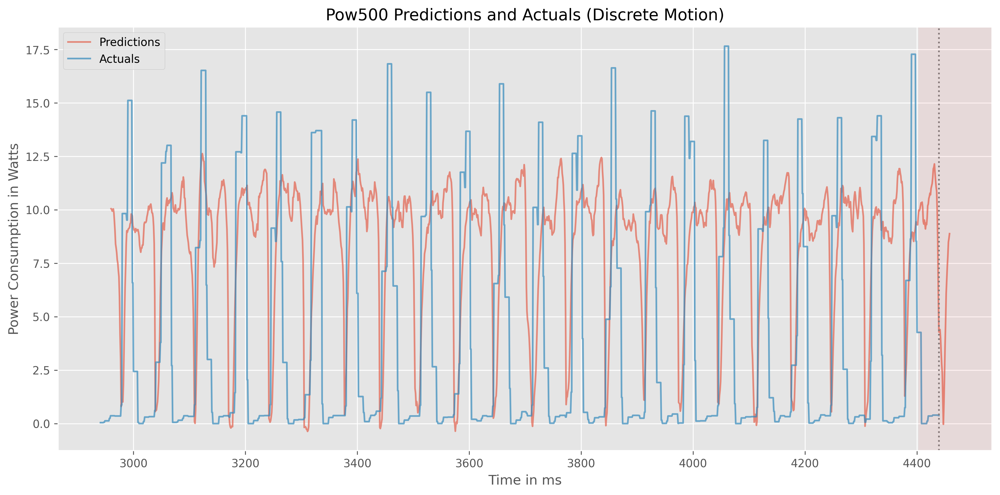

...

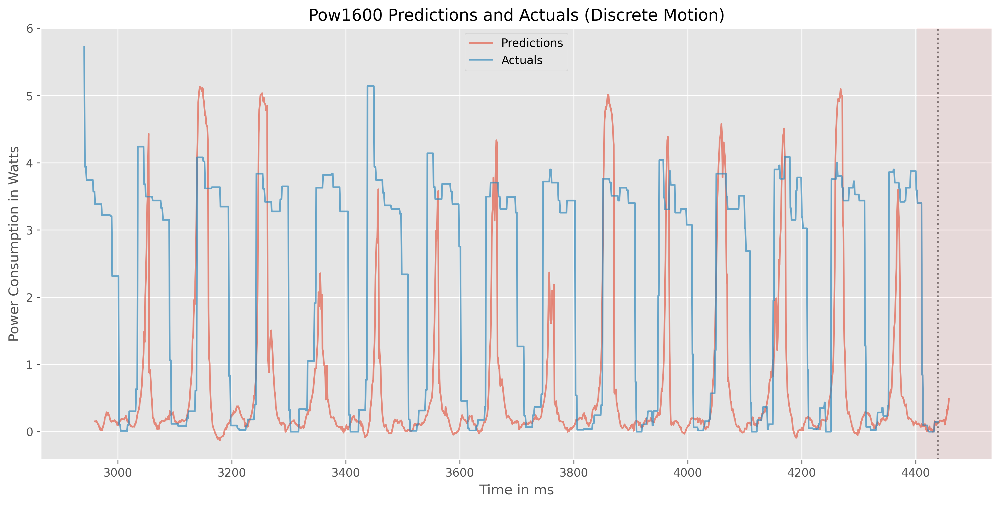

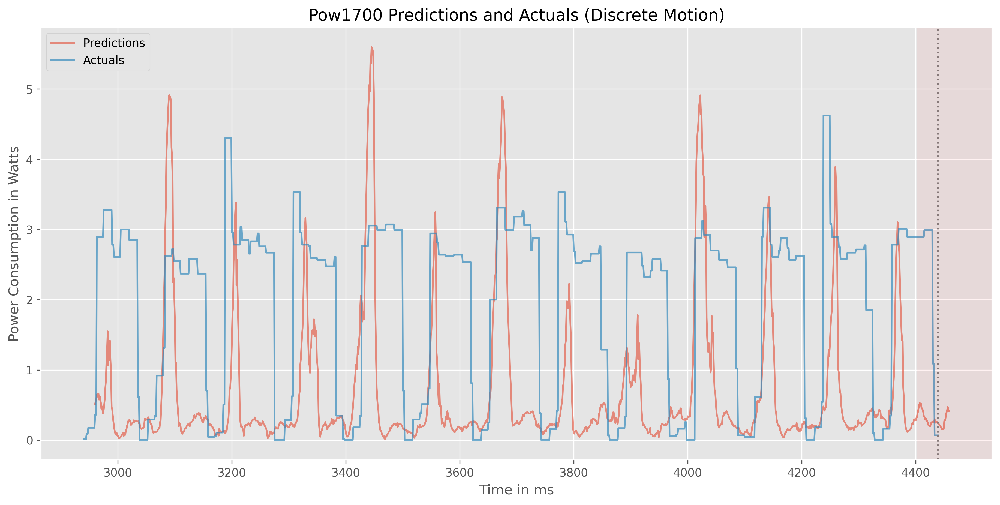

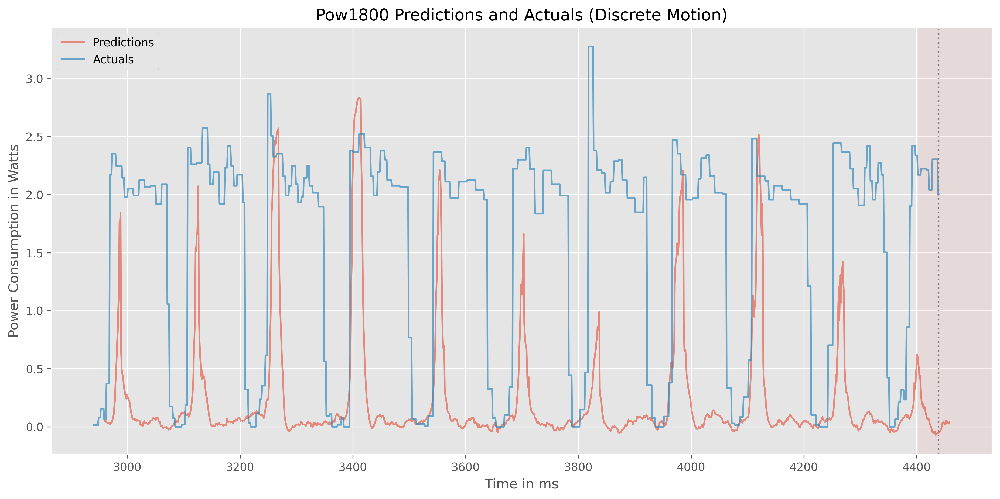

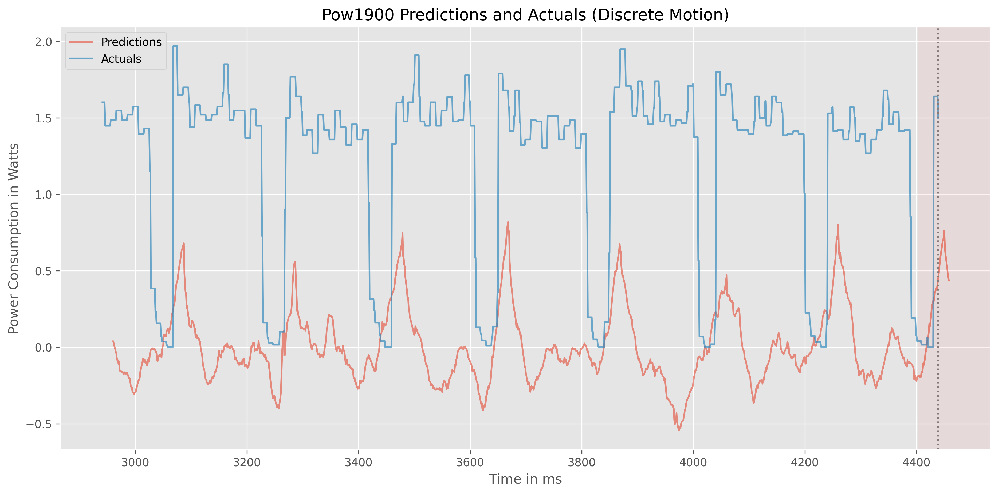

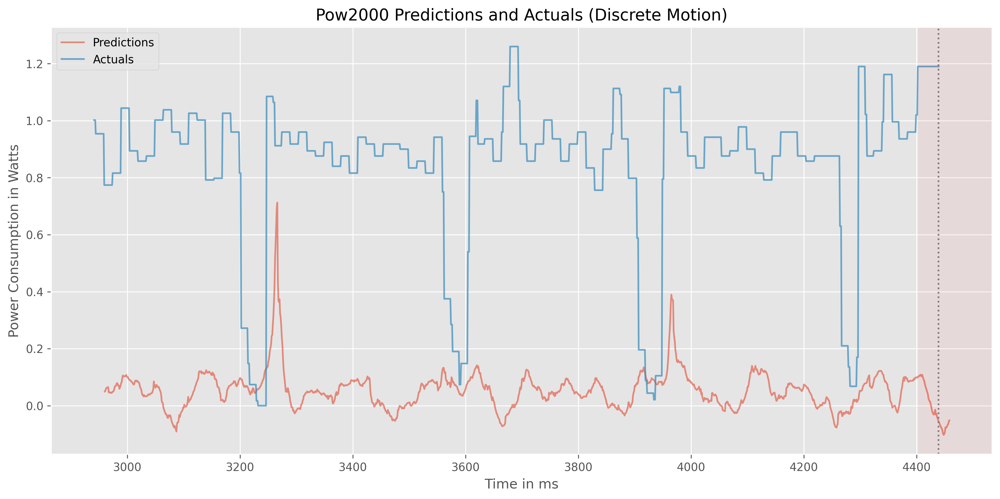

In [50]:
print_act_and_pred_tables(re_yhat2,re_y_test2,20, -1500,-1)